Compares simple KNN, DBSCAN with our mehod on the LR score

root_attr: version
root_attr: multiscales
datasets [{'path': '0', 'coordinateTransformations': [{'type': 'scale', 'scale': [1.0, 1.0]}]}, {'path': '1', 'coordinateTransformations': [{'type': 'scale', 'scale': [2.0000650956906654, 2.000046674445741]}]}, {'path': '2', 'coordinateTransformations': [{'type': 'scale', 'scale': [4.000130191381331, 4.000280059746079]}]}, {'path': '3', 'coordinateTransformations': [{'type': 'scale', 'scale': [8.001302083333334, 8.000560119492159]}]}, {'path': '4', 'coordinateTransformations': [{'type': 'scale', 'scale': [16.002604166666668, 16.001120238984317]}]}]
resolution: 0
 - shape ('y', 'x') = (30725, 42851)
 - chunks =  ['4096 (+ 2053)', '4096 (+ 1891)']
 - dtype = uint32
resolution: 1
 - shape ('y', 'x') = (15362, 21425)
 - chunks =  ['4096 (+ 3074)', '4096 (+ 945)']
 - dtype = uint32
resolution: 2
 - shape ('y', 'x') = (7681, 10712)
 - chunks =  ['4096 (+ 3585)', '4096 (+ 2520)']
 - dtype = uint32
resolution: 3
 - shape ('y', 'x') = (3840, 5356)
 - ch

Graph pruned by 'distance'. stored in 'pruned_spatial_connectivities'.


... storing 'feature_types' as categorical
... storing 'genome' as categorical


/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


Building LR Adjacency matrices...
Detectable human interactions: 13
Detectable mouse interactions: 0
Computing LR Niche Scores...

--- Results ---
Global LR Score: 0.06315667496727512


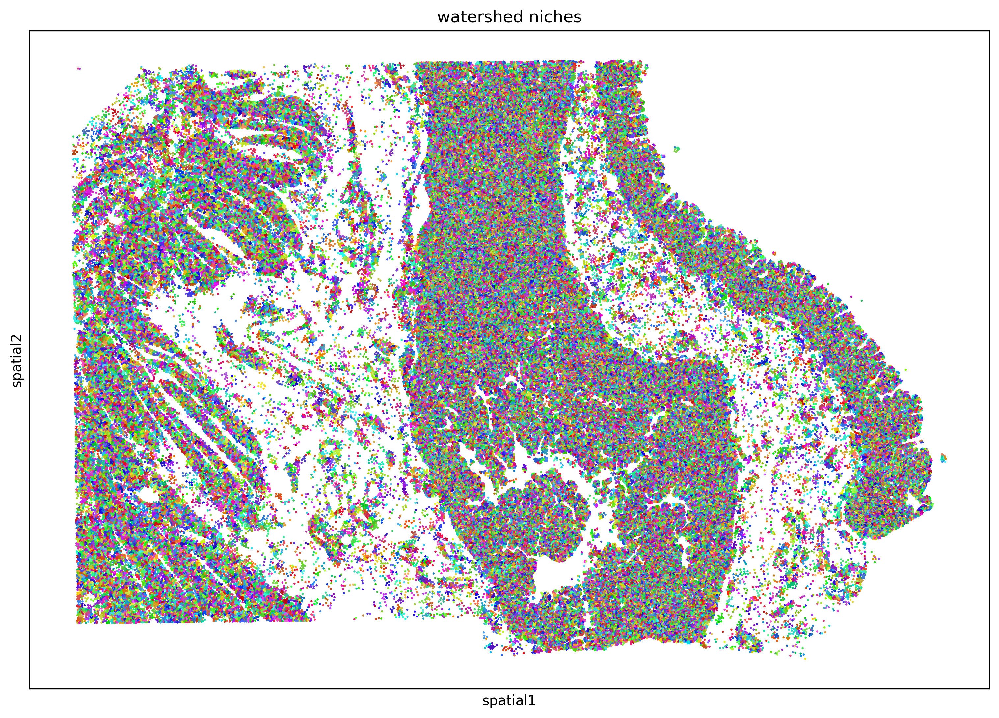

In [2]:
from src import clustering, graph_utils, plotting, LR
import spatialdata as sd
import os
import squidpy as sq

INPUT_DIR = "zarr/"

# --- 1. Load Data ---
sdata = sd.read_zarr(os.path.join(INPUT_DIR, "Colon_Human.zarr"))
adata = sdata.tables["table"]

# --- 2. Spatial Clustering & Niche Identification ---
K = 1
graph_utils.get_distances(adata, k=K, log=True)
results = clustering.fit_gmm(adata, distance_key="1_nn_distance", k_range=range(1,10))
best_model_icl = clustering.choose_component(results, criterion="icl", delta_bic_threshold=10.0)

adata.obs["gmm_labels"] = best_model_icl["labels"]
adata.obs["gmm_labels"] = adata.obs["gmm_labels"].astype("category") 

graph_utils.get_neighbors(adata, type="knn")
graph_utils.prune_graph(adata, gmm_key="gmm_labels", distance_key="1_nn_distance", prune_by="distance")
clustering.watershed_by_descent(adata, distances_key="1_nn_distance", spatial_connectivity_key="pruned_spatial_connectivities")

# --- 3. Plot Niches ---
plotting.assign_colors(sdata, "watershed_by_descent")
sq.pl.spatial_scatter(
        adata,
        color="watershed_by_descent",
        size=1,
        title="watershed niches",
        shape=None,      
        legend_loc=None, 
        dpi=300,
        figsize=(10, 10),
    )

# ==========================================
# --- 4. Ligand-Receptor Niche Scoring ---
# ==========================================

# Step A: Build the human & mouse LR adjacency matrices in adata.varm
print("Building LR Adjacency matrices...")
LR.get_LR_pairs(adata)

# Step B: Calculate the scores using the human matrix and your watershed niches
print("Computing LR Niche Scores...")
LR.compute_lr_niche_scores(
    adata=adata,
    lr_adj_key="liana_adj_human",         # Using human DB for human colon data
    niche_key="watershed_by_descent"      # The niches you just calculated
)

# Step C: Inspect the calculated scores
print("\n--- Results ---")
print("Global LR Score:", adata.uns["lr_global_score"])
# print("Per-Niche LR Sum Scores:", adata.uns["lr_niche_scores"])
# print("Per-Niche Cell Fraction Scores:", adata.uns["lr_cell_fraction_scores"])

root_attr: version
root_attr: multiscales
datasets [{'path': '0', 'coordinateTransformations': [{'type': 'scale', 'scale': [1.0, 1.0]}]}, {'path': '1', 'coordinateTransformations': [{'type': 'scale', 'scale': [2.0000650956906654, 2.000046674445741]}]}, {'path': '2', 'coordinateTransformations': [{'type': 'scale', 'scale': [4.000130191381331, 4.000280059746079]}]}, {'path': '3', 'coordinateTransformations': [{'type': 'scale', 'scale': [8.001302083333334, 8.000560119492159]}]}, {'path': '4', 'coordinateTransformations': [{'type': 'scale', 'scale': [16.002604166666668, 16.001120238984317]}]}]
resolution: 0
 - shape ('y', 'x') = (30725, 42851)
 - chunks =  ['4096 (+ 2053)', '4096 (+ 1891)']
 - dtype = uint32
resolution: 1
 - shape ('y', 'x') = (15362, 21425)
 - chunks =  ['4096 (+ 3074)', '4096 (+ 945)']
 - dtype = uint32
resolution: 2
 - shape ('y', 'x') = (7681, 10712)
 - chunks =  ['4096 (+ 3585)', '4096 (+ 2520)']
 - dtype = uint32
resolution: 3
 - shape ('y', 'x') = (3840, 5356)
 - ch

/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


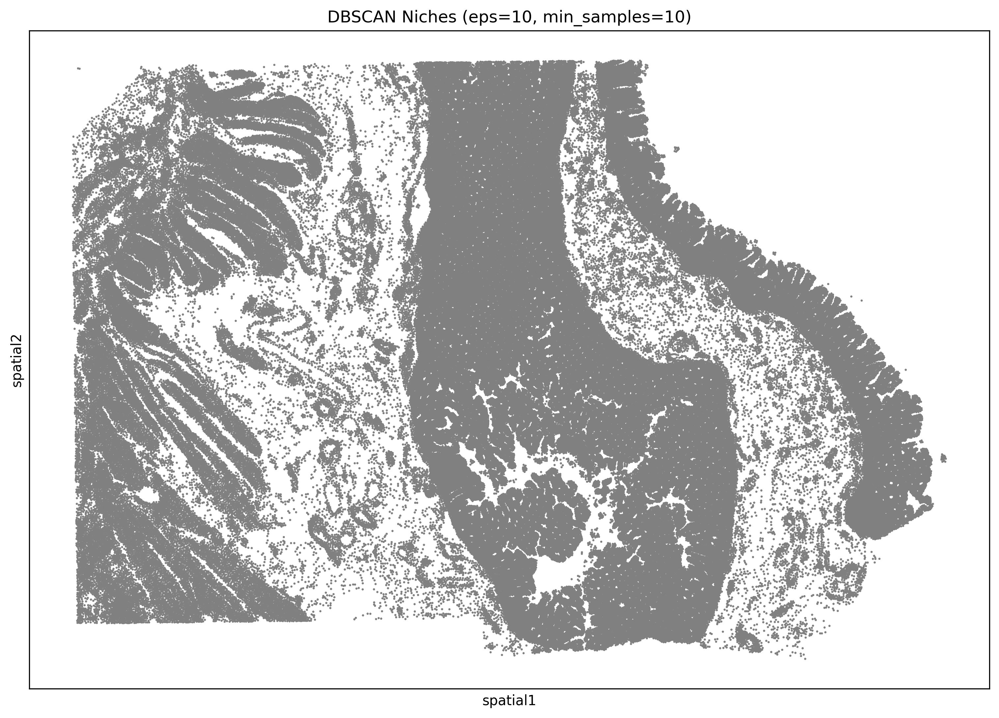

In [ ]:
import spatialdata as sd
import squidpy as sq
from sklearn.cluster import DBSCAN
import os

def run_dbscan_on_zarr(zarr_dir, eps=0.5, min_samples=5, figsize=(10, 10), dpi=300):
    """
    Reads a .zarr spatialdata directory, extracts x,y coordinates, 
    runs DBSCAN to identify spatial niches, and plots the results.
    """
    # 1. Load the spatialdata object from the .zarr directory
    sdata = sd.read_zarr(zarr_dir)
    adata = sdata.tables["table"]
    
    # 2. Extract spatial coordinates
    # Squidpy and SpatialData conventionally store these in obsm['spatial']
    if "spatial" not in adata.obsm:
        raise ValueError("Spatial coordinates not found in adata.obsm['spatial'].")
        
    coords = adata.obsm["spatial"]
    
    # 3. Initialize and fit the DBSCAN algorithm
    # eps = maximum distance between two samples for one to be considered in the neighborhood
    # min_samples = number of samples in a neighborhood for a point to be considered a core point
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    
    # 4. Save the labels back to the AnnData object as a categorical variable
    # Note: DBSCAN assigns -1 to noisy outliers; we convert all to strings for categorical plotting
    adata.obs["dbscan_niches"] = dbscan.fit_predict(coords).astype(str)
    adata.obs["dbscan_niches"] = adata.obs["dbscan_niches"].astype("category")
    
    # 5. Visualize the niches using spatial_scatter
    sq.pl.spatial_scatter(
        adata,
        color="dbscan_niches",
        size=1,
        title=f"DBSCAN Niches (eps={eps}, min_samples={min_samples})",
        shape=None,       
        legend_loc="none", 
        dpi=dpi,
        figsize=figsize
    )
    
    # Return the updated AnnData object for any downstream analysis
    return adata

# Example usage:
INPUT_DIR = "zarr/"
zarr_path = os.path.join(INPUT_DIR, "Colon_Human.zarr")
import numpy as np
updated_adata = run_dbscan_on_zarr(zarr_path, eps=10, min_samples=10)

root_attr: version
root_attr: multiscales
datasets [{'path': '0', 'coordinateTransformations': [{'type': 'scale', 'scale': [1.0, 1.0]}]}, {'path': '1', 'coordinateTransformations': [{'type': 'scale', 'scale': [2.0000650956906654, 2.000046674445741]}]}, {'path': '2', 'coordinateTransformations': [{'type': 'scale', 'scale': [4.000130191381331, 4.000280059746079]}]}, {'path': '3', 'coordinateTransformations': [{'type': 'scale', 'scale': [8.001302083333334, 8.000560119492159]}]}, {'path': '4', 'coordinateTransformations': [{'type': 'scale', 'scale': [16.002604166666668, 16.001120238984317]}]}]
resolution: 0
 - shape ('y', 'x') = (30725, 42851)
 - chunks =  ['4096 (+ 2053)', '4096 (+ 1891)']
 - dtype = uint32
resolution: 1
 - shape ('y', 'x') = (15362, 21425)
 - chunks =  ['4096 (+ 3074)', '4096 (+ 945)']
 - dtype = uint32
resolution: 2
 - shape ('y', 'x') = (7681, 10712)
 - chunks =  ['4096 (+ 3585)', '4096 (+ 2520)']
 - dtype = uint32
resolution: 3
 - shape ('y', 'x') = (3840, 5356)
 - ch

Loading data from zarr/Colon_Human.zarr...
Optimal eps automatically identified at: 30.7484


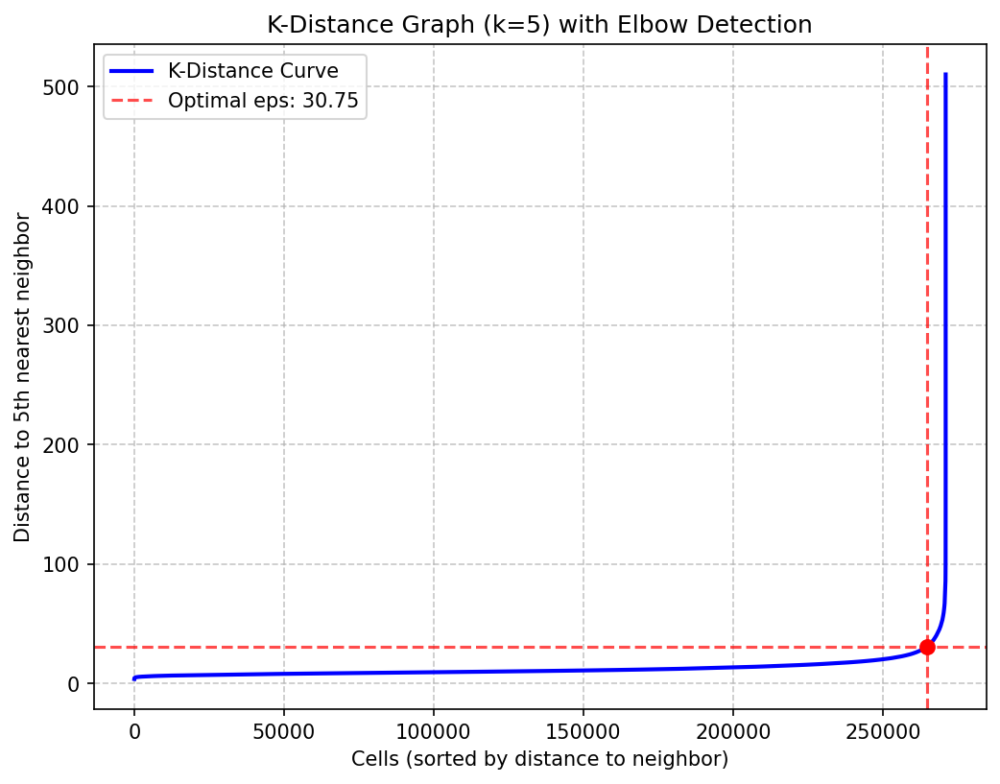

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import spatialdata as sd

def plot_k_distance(zarr_dir, min_samples=5):
    """
    Calculates and plots the k-distance graph to find the optimal eps for DBSCAN.
    Includes automatic elbow detection.
    """
    print(f"Loading data from {zarr_dir}...")
    sdata = sd.read_zarr(zarr_dir)
    coords = sdata.tables["table"].obsm["spatial"]
    
    # 1. Fit Nearest Neighbors
    nn = NearestNeighbors(n_neighbors=min_samples)
    nn.fit(coords)
    
    # 2. Get the distances
    distances, _ = nn.kneighbors(coords)
    
    # 3. Isolate the distance to the *furthest* neighbor in that group
    k_distances = np.sort(distances[:, -1])
    
    # --- 4. AUTOMATIC ELBOW DETECTION ---
    # Create an array of coordinates for the curve: (index, distance)
    n_points = len(k_distances)
    all_coords = np.vstack((np.arange(n_points), k_distances)).T
    
    # Define the line connecting the first and last points of the curve
    first_point = all_coords[0]
    last_point = all_coords[-1]
    line_vec = last_point - first_point
    
    # Normalize the line vector
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))
    
    # Vector from the first point to all other points on the curve
    vec_from_first = all_coords - first_point
    
    # Calculate the perpendicular distance from each point to the line using the cross product
    # Formula: |(P - P1) x (P2 - P1)_normalized|
    cross_product = (vec_from_first[:, 0] * line_vec_norm[1]) - (vec_from_first[:, 1] * line_vec_norm[0])
    distances_to_line = np.abs(cross_product)
    
    # The elbow is the point with the maximum distance to the line
    elbow_index = np.argmax(distances_to_line)
    optimal_eps = k_distances[elbow_index]
    
    print(f"Optimal eps automatically identified at: {optimal_eps:.4f}")
    
    # --- 5. Plot the results ---
    plt.figure(figsize=(8, 6), dpi=150)
    plt.plot(k_distances, color='blue', linewidth=2, label='K-Distance Curve')
    
    # Plot the elbow point and lines
    plt.axhline(y=optimal_eps, color='red', linestyle='--', alpha=0.7, label=f'Optimal eps: {optimal_eps:.2f}')
    plt.axvline(x=elbow_index, color='red', linestyle='--', alpha=0.7)
    plt.scatter(elbow_index, optimal_eps, color='red', s=50, zorder=5) # Mark the exact point
    
    plt.title(f"K-Distance Graph (k={min_samples}) with Elbow Detection")
    plt.xlabel("Cells (sorted by distance to neighbor)")
    plt.ylabel(f"Distance to {min_samples}th nearest neighbor")
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.legend()
    plt.show()
    
    return optimal_eps

# Example usage:
# optimal_eps = plot_k_distance("zarr/debug_dataset.zarr", min_samples=4)
optimal_eps = plot_k_distance("zarr/Colon_Human.zarr", min_samples=5)

Loading data from zarr/debug_dataset.zarr...
Running DBSCAN for 36 parameter combinations...


/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: U

/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: U

/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: U

/home/ktang/anaconda3/envs/single_cell_p311/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


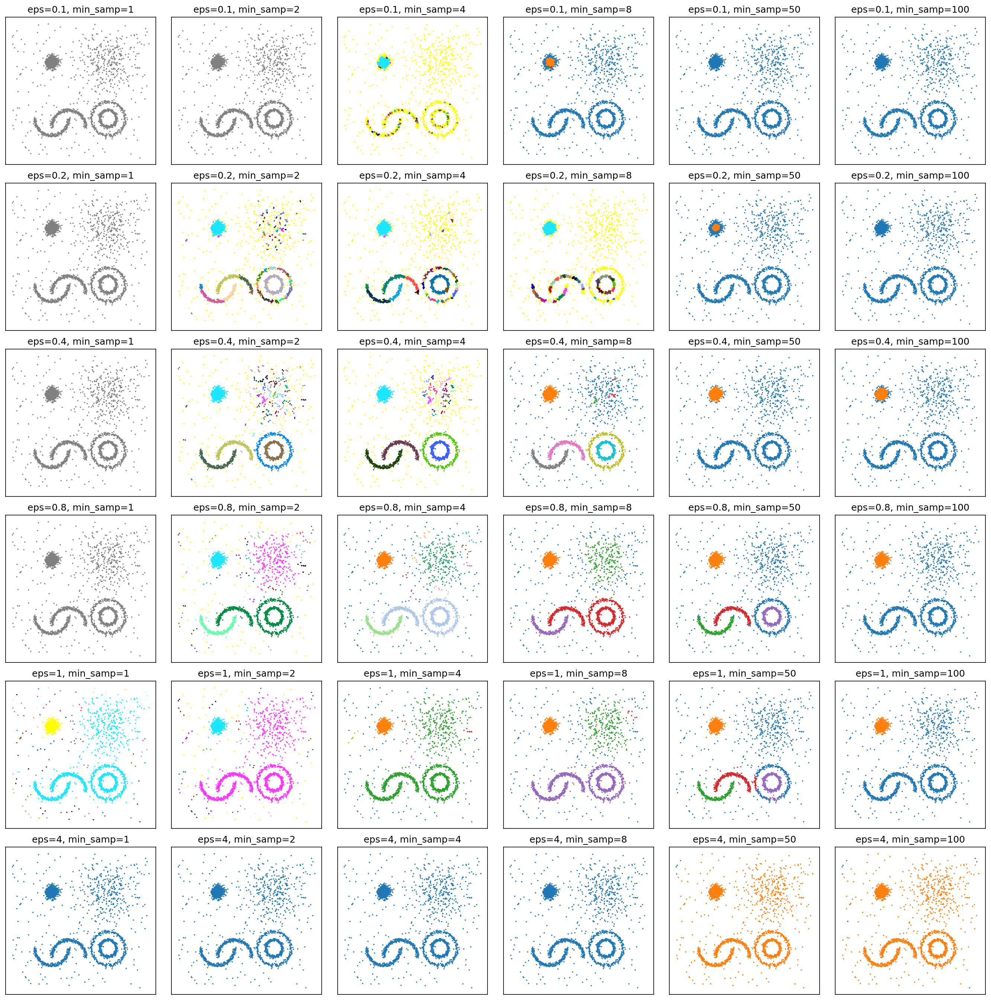

In [5]:
import spatialdata as sd
import squidpy as sq
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import os

def run_dbscan_grid_search(zarr_dir, eps_values, min_samples_values, figsize_per_plot=(3, 3), dpi=150):
    """
    Loads spatialdata, runs a grid search over DBSCAN parameters, 
    and plots the results in a grid.
    """
    # 1. Load the data ONCE to save time and memory
    print(f"Loading data from {zarr_dir}...")
    sdata = sd.read_zarr(zarr_dir)
    adata = sdata.tables["table"]
    
    if "spatial" not in adata.obsm:
        raise ValueError("Spatial coordinates not found in adata.obsm['spatial'].")
        
    coords = adata.obsm["spatial"]
    
    # 2. Setup the matplotlib grid
    n_rows = len(eps_values)
    n_cols = len(min_samples_values)
    
    fig, axes = plt.subplots(
        nrows=n_rows, 
        ncols=n_cols, 
        figsize=(n_cols * figsize_per_plot[0], n_rows * figsize_per_plot[1]),
        dpi=dpi
    )
    
    print(f"Running DBSCAN for {n_rows * n_cols} parameter combinations...")
    
    # 3. Iterate through parameter combinations
    for i, eps in enumerate(eps_values):
        for j, min_samples in enumerate(min_samples_values):
            # Select the correct subplot axis
            ax = axes[i, j]
            
            # Run DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            
            # Create a unique column name for each parameter combination
            col_name = f"dbscan_e{eps}_m{min_samples}"
            
            adata.obs[col_name] = dbscan.fit_predict(coords).astype(str)
            adata.obs[col_name] = adata.obs[col_name].astype("category")
            
            # Plot on the specific axis
            # Plot on the specific axis
            sq.pl.spatial_scatter(
                adata,
                color=col_name,
                size=1,
                title=f"eps={eps}, min_samp={min_samples}",
                shape=None,       
                legend_loc=None, 
                ax=ax            # <-- Just pass the ax, no 'show' argument needed!
            )
            
            # Clean up axes for a cleaner grid view
            ax.set_xlabel("")
            ax.set_ylabel("")
            ax.set_xticks([])
            ax.set_yticks([])

    # Adjust layout so plots don't overlap
    plt.tight_layout()
    plt.show()
    
    return adata

# Example usage:
INPUT_DIR = "zarr/"
zarr_path = os.path.join(INPUT_DIR, "debug_dataset.zarr")

eps_list = [0.1, 0.2, 0.4, 0.8, 1, 4]
min_samples_list = [1, 2, 4, 8, 50, 100]

# Run the sweep and generate the grid plot
updated_adata = run_dbscan_grid_search(zarr_path, eps_values=eps_list, min_samples_values=min_samples_list)